In [3]:
!date

Fri Sep 12 11:46:19 PDT 2025


## T cells of interest: TH1, TH2, TH17, TFH, TFR
> No verification for TH1/TH2
> 
> No ground truth for cytokine production & just need to go based on the vibes of the top marker genes

In [1]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

In [4]:
import pandas as pd

In [2]:
adata = sc.read_h5ad('../../../data/rna/pbmc-subsets/pbmc-t-cd4-mm-nmf-processed.h5ad')

In [7]:
usage = pd.read_parquet( "../../../data/rna/starcat/pbmc-t-cd4-mm-starcat-usages.parquet")
scores = pd.read_parquet( "../../../data/rna/starcat/pbmc-t-cd4-mm-starcat-scores.parquet")

In [8]:
# Merge usages and scores with cell metadata
adata.obs = pd.merge(
    left=adata.obs, right=usage, how="left", left_index=True, right_index=True
)

# Modify object type to string for plotting in scanpy
scores[scores.columns[scores.columns.str.contains("_binary")]] = scores[
    scores.columns[scores.columns.str.contains("_binary")]
].astype("str")
adata.obs = pd.merge(
    left=adata.obs, right=scores, how="left", left_index=True, right_index=True
)

In [14]:
adata

AnnData object with n_obs × n_vars = 629845 × 31915
    obs: 'batch_id', 'cell_name', 'chip_id', 'hto_barcode', 'hto_category', 'n_genes', 'n_mito_umis', 'n_reads', 'n_umis', 'original_barcodes', 'pbmc_sample_id', 'pool_id', 'seurat_pbmc_type', 'seurat_pbmc_type_score', 'umap_1', 'umap_2', 'well_id', 'aifi_l1', 'aifi_l2', 'aifi_l3', 'predicted_doublet', 'doublet_score', 'sample.sampleKitGuid', 'sample.visitDetails', 'sample.visitName', 'sample.drawDate', 'sample.daysSinceFirstVisit', 'sample.diseaseStatesRecordedAtVisit', 'subject.biologicalSex', 'subject.birthYear', 'subject.ethnicity', 'subject.partnerCode', 'subject.race', 'subject.subjectGuid', 'specimen.specimenGuid', 'cohort.cohortGuid', 'manual.time_stamp', 'tissue', 'manual.response', 'manual.response_type', 'manual.extracted_name', 'manual.batch_id', 'manual.category', 'manual.treatment_dara', 'manual.flu_response', 'aifi_label_l1', 'aifi_celltype_l1', 'aifi_label_l2', 'aifi_celltype_l2', 'aifi_label_l3', 'aifi_celltype_l3', '

In [17]:
adata.obsm['X_umap'] = adata.obsm['base_umap'] 
adata.obsm['X_tsne'] = adata.obsm['X_tsne'] 

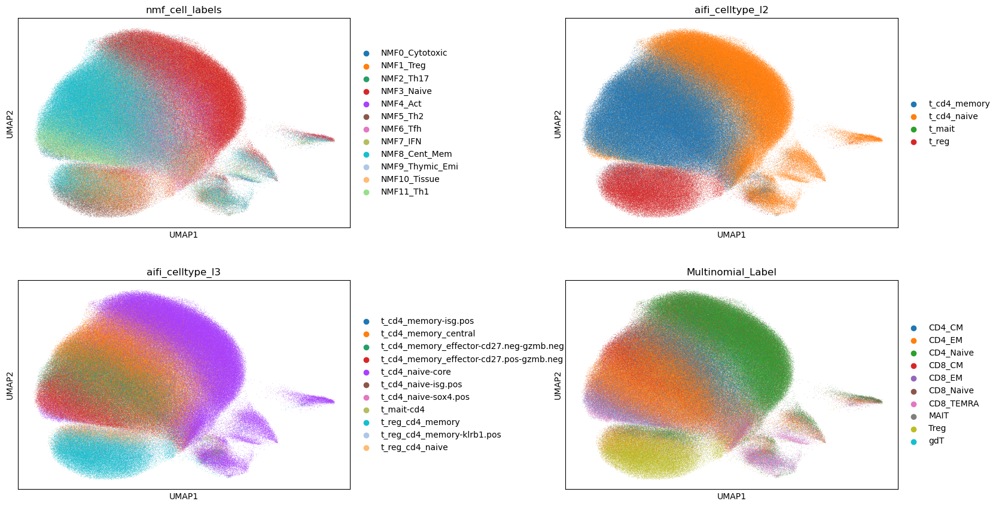

In [18]:
sc.pl.umap(adata, color=['nmf_cell_labels', 'aifi_celltype_l2', 'aifi_celltype_l3', 'Multinomial_Label'], size=0.7, wspace=0.5, ncols=2)

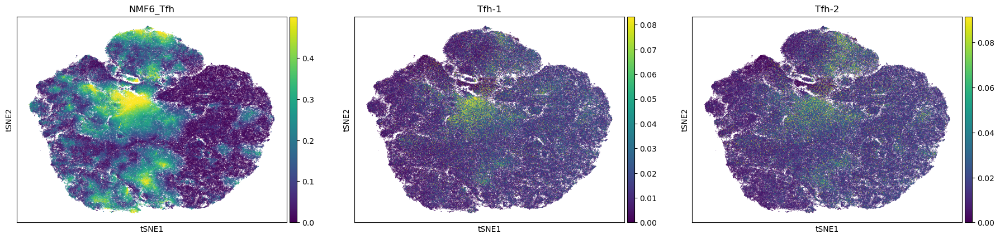

In [24]:
sc.pl.tsne(adata, color=['NMF6_Tfh', 'Tfh-1', 'Tfh-2'], size=1, vmin=0, vmax='p99')

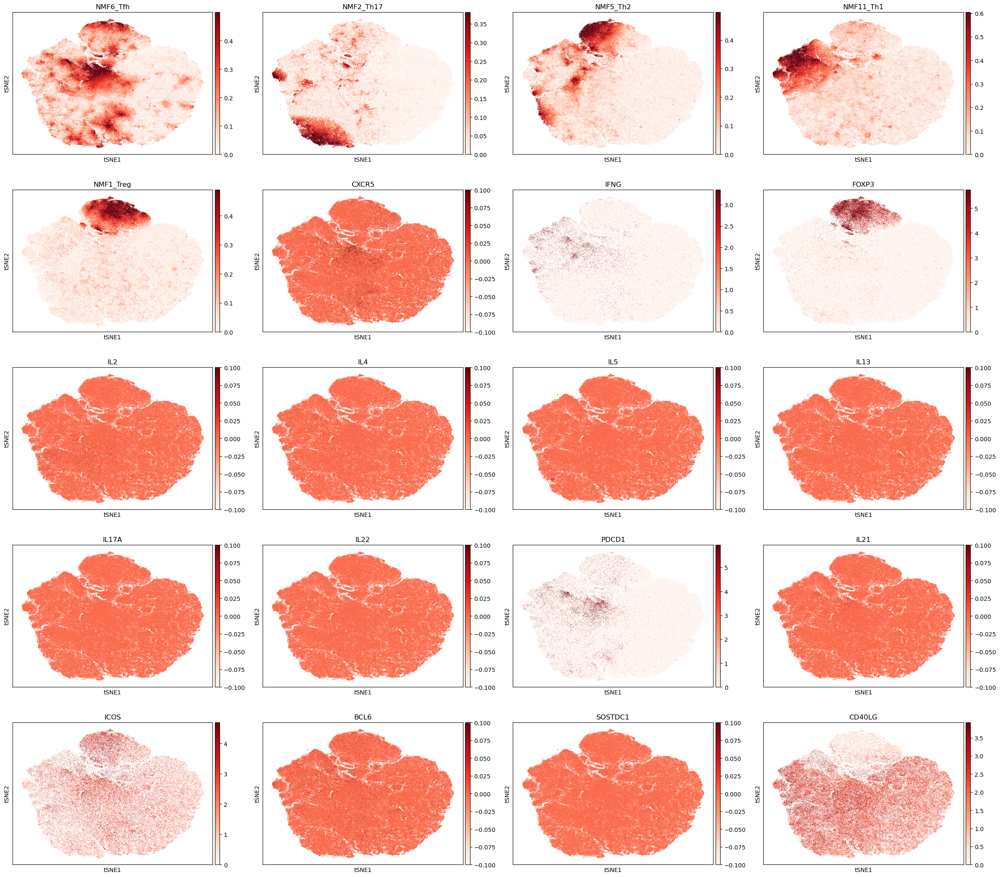

In [23]:
sc.pl.tsne(adata,
           color=['NMF6_Tfh', 'NMF2_Th17',
                  'NMF5_Th2', 'NMF11_Th1', 'NMF1_Treg',
                  'CXCR5', 'IFNG',
                  'FOXP3', 'IL2', 'IL4',
                  'IL5', 'IL13',
                  'IL17A', 'IL22',
                  'PDCD1', 'IL21',
                  'ICOS', 'BCL6',
                  'SOSTDC1', 'CD40LG'],
           size=1,
           use_raw=False, vmax='p99', cmap='Reds')

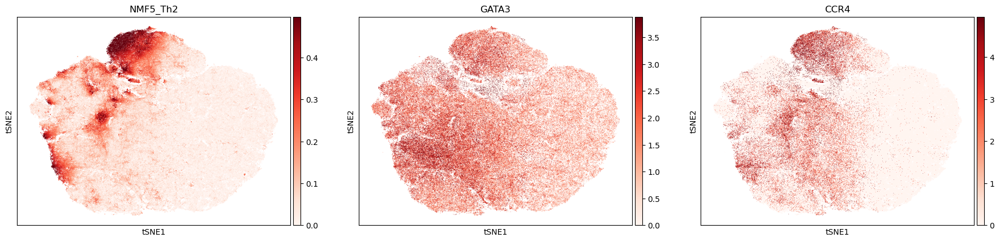

In [28]:
sc.pl.tsne(adata,
           color=['NMF5_Th2',
                  'GATA3', 'CCR4'],
           size=1,
           use_raw=False, vmax='p99', cmap='Reds')

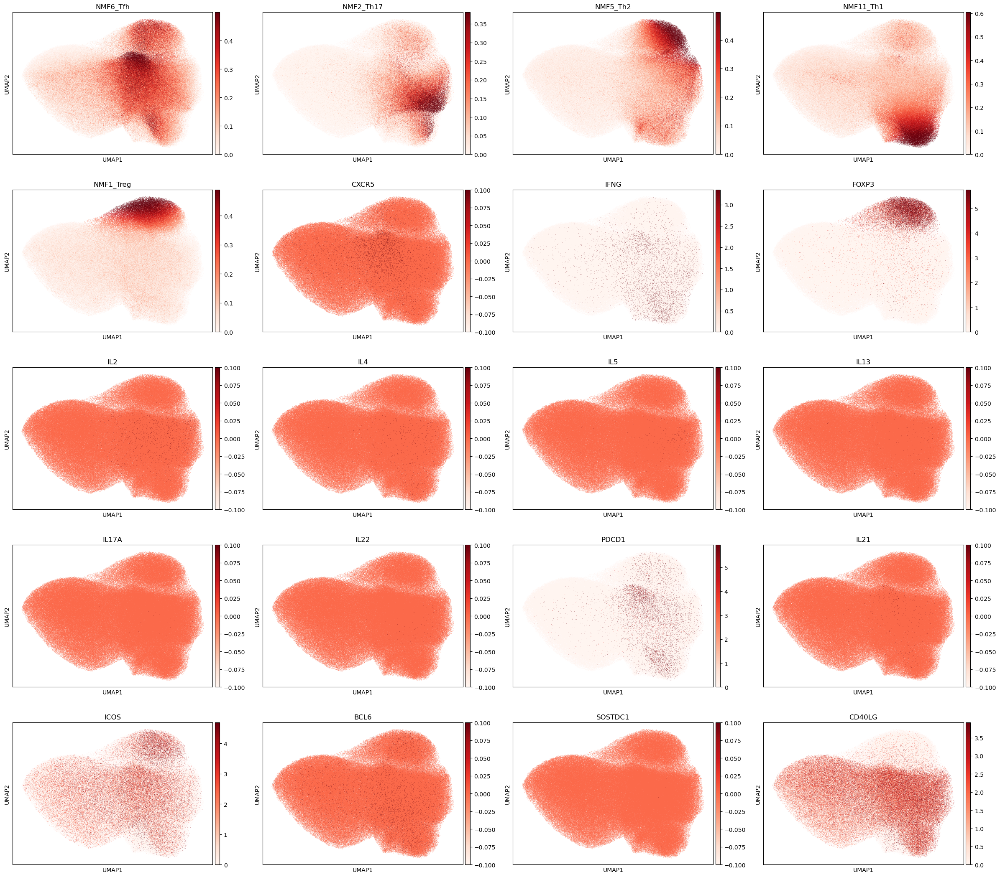

In [24]:
sc.pl.umap(adata,
           color=['NMF6_Tfh', 'NMF2_Th17',
                  'NMF5_Th2', 'NMF11_Th1', 'NMF1_Treg',
                  'CXCR5', 'IFNG',
                  'FOXP3', 'IL2', 'IL4',
                  'IL5', 'IL13',
                  'IL17A', 'IL22',
                  'PDCD1', 'IL21',
                  'ICOS', 'BCL6',
                  'SOSTDC1', 'CD40LG'],
           size=1,
           use_raw=False, vmax='p99', cmap='Reds')

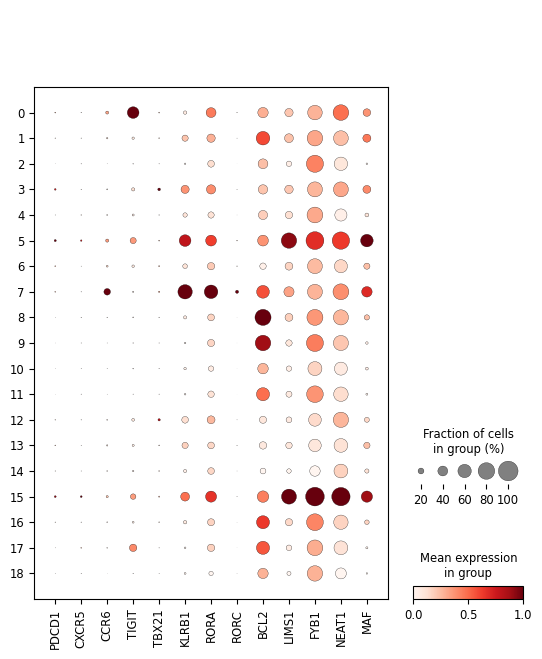

In [6]:
sc.pl.dotplot(
    adata, 
    ['PDCD1', 'CXCR5', 
     'CCR6', 'TIGIT', 'TBX21', 'KLRB1', 'RORA', 'RORC', 'BCL2', 'LIMS1', 'FYB1', 'NEAT1', 'MAF'], 
    groupby='nmf_leiden', 
    standard_scale='var', 
    dendrogram=False
)

In [11]:
AIFI_L3_values_to_remove = ['Core naive CD4 T cell', 'Naive CD4 Treg', 'ISG+ naive CD4 T cell', 'SOX4+ naive CD4 T cell']
adata_sub = adata[~adata.obs['aifi_label_l3'].isin(AIFI_L3_values_to_remove)]
adata_sub

View of AnnData object with n_obs × n_vars = 342148 × 31915
    obs: 'batch_id', 'cell_name', 'chip_id', 'hto_barcode', 'hto_category', 'n_genes', 'n_mito_umis', 'n_reads', 'n_umis', 'original_barcodes', 'pbmc_sample_id', 'pool_id', 'seurat_pbmc_type', 'seurat_pbmc_type_score', 'umap_1', 'umap_2', 'well_id', 'aifi_l1', 'aifi_l2', 'aifi_l3', 'predicted_doublet', 'doublet_score', 'sample.sampleKitGuid', 'sample.visitDetails', 'sample.visitName', 'sample.drawDate', 'sample.daysSinceFirstVisit', 'sample.diseaseStatesRecordedAtVisit', 'subject.biologicalSex', 'subject.birthYear', 'subject.ethnicity', 'subject.partnerCode', 'subject.race', 'subject.subjectGuid', 'specimen.specimenGuid', 'cohort.cohortGuid', 'manual.time_stamp', 'tissue', 'manual.response', 'manual.response_type', 'manual.extracted_name', 'manual.batch_id', 'manual.category', 'manual.treatment_dara', 'manual.flu_response', 'aifi_label_l1', 'aifi_celltype_l1', 'aifi_label_l2', 'aifi_celltype_l2', 'aifi_label_l3', 'aifi_celltyp

In [12]:
combined_matrix1 = adata_sub.obs[['NMF0_Cytotoxic', 'NMF1_Treg', 'NMF2_Th17', 'NMF4_Act', 'NMF5_Th2', 'NMF6_Tfh', 'NMF11_Th1']].values
combined_matrix1
adata_sub.obsm['NMF_fac_v1'] = combined_matrix1
adata_sub

/tmp/ipykernel_9421/3541980250.py:3: ImplicitModificationWarning: Setting element `.obsm['NMF_fac_v1']` of view, initializing view as actual.
  adata_sub.obsm['NMF_fac_v1']=combined_matrix1


AnnData object with n_obs × n_vars = 342148 × 31915
    obs: 'batch_id', 'cell_name', 'chip_id', 'hto_barcode', 'hto_category', 'n_genes', 'n_mito_umis', 'n_reads', 'n_umis', 'original_barcodes', 'pbmc_sample_id', 'pool_id', 'seurat_pbmc_type', 'seurat_pbmc_type_score', 'umap_1', 'umap_2', 'well_id', 'aifi_l1', 'aifi_l2', 'aifi_l3', 'predicted_doublet', 'doublet_score', 'sample.sampleKitGuid', 'sample.visitDetails', 'sample.visitName', 'sample.drawDate', 'sample.daysSinceFirstVisit', 'sample.diseaseStatesRecordedAtVisit', 'subject.biologicalSex', 'subject.birthYear', 'subject.ethnicity', 'subject.partnerCode', 'subject.race', 'subject.subjectGuid', 'specimen.specimenGuid', 'cohort.cohortGuid', 'manual.time_stamp', 'tissue', 'manual.response', 'manual.response_type', 'manual.extracted_name', 'manual.batch_id', 'manual.category', 'manual.treatment_dara', 'manual.flu_response', 'aifi_label_l1', 'aifi_celltype_l1', 'aifi_label_l2', 'aifi_celltype_l2', 'aifi_label_l3', 'aifi_celltype_l3', '

In [13]:
sc.pp.neighbors(adata_sub, n_neighbors=15, use_rep='NMF_fac_v1',
                key_added="NMF_neighbors_v1")

sc.tl.umap(adata_sub, neighbors_key='NMF_neighbors_v1')
sc.tl.leiden(adata_sub, resolution=0.5, key_added="leiden_NMF_0.5_v1",
             n_iterations=2, neighbors_key='NMF_neighbors_v1')

sc.tl.leiden(adata_sub, key_added="leiden_NMF_v1", n_iterations=2,
             neighbors_key='NMF_neighbors_v1')  # default resolution "1"
adata_sub.obsm['nmf_sub_umap'] = adata_sub.obsm['X_umap'].copy()

/tmp/ipykernel_9421/2764587220.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_sub,resolution=0.5, key_added="leiden_NMF_0.5_v1",n_iterations=2, neighbors_key='NMF_neighbors_v1')


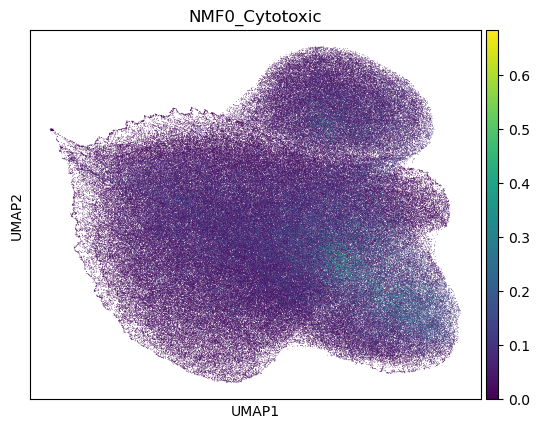

In [29]:
sc.pl.umap(adata_sub, color='NMF0_Cytotoxic', size=1)

In [ ]:
## remove this from the weight matrix and try again 